# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'1.0.1'

## Specifying filetype, and folder as before

In [38]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [52]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Strong' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')
if batch=='Std':
    GroupN_df=joblib.load('Std_df.sav')

GroupN_df

,filename,rays_present,approx_split,Diad1_pos,Diad2_pos,HB1_pos,HB2_pos,C13_pos,Diad1_abs_prom,Diad2_abs_prom,...,HB2_height,C13_height,Diad1_height,HB1_height,Diad1_Median_Bck,Diad2_Median_Bck,C13_HB2_abs_prom_ratio,Diad2_HB2_Valley_prom,HB1_prom/std_betweendiads,HB2_prom/std_betweendiads


### Now load one file from this group to tweak parameters for

In [40]:
Diad_Files =GroupN_df['filename']
i=4


### Lets plot the diad to have a look at it

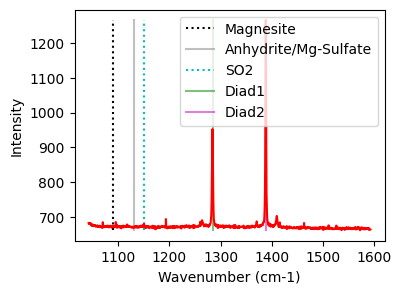

In [41]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [42]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [43]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

# FG04 Standards
if batch=='Std':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init


if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240), upper_bck_diad1=(1315, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=285.7421249319284, HB_prom=nan, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1285.679458,1285.679458,0.004961,1259.902772,0.663571,0,728.030497,3.794573,0.569826,1.327141,Flagged Warnings:,1.056701,1.020408,0.07525,0.001823,PseudoVoigtModel


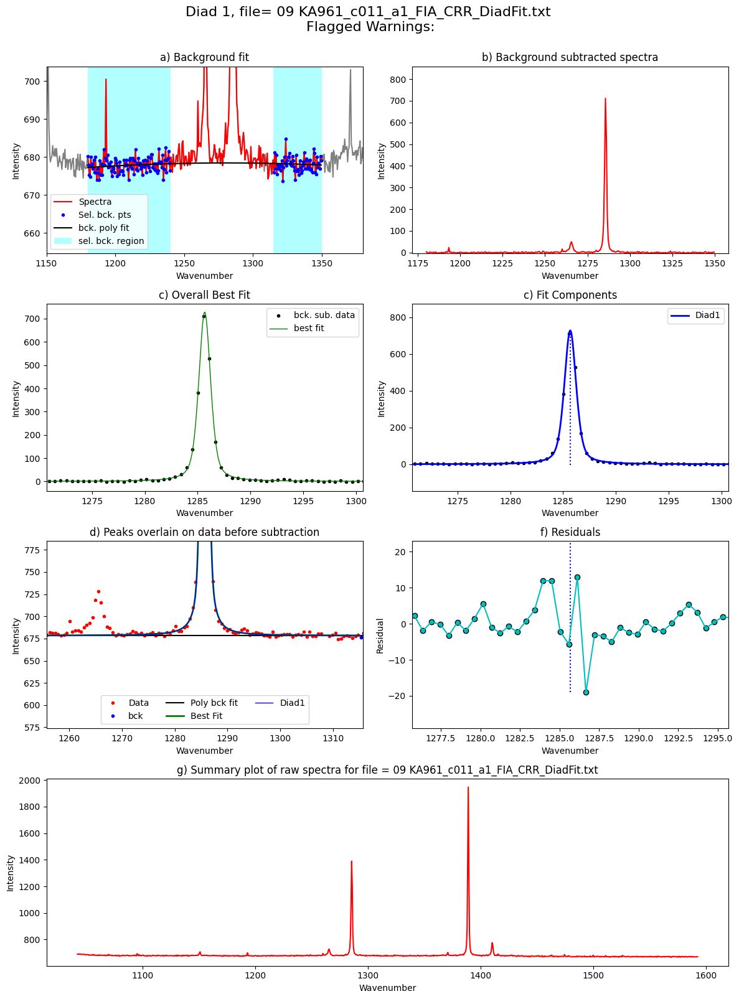

In [44]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [45]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [46]:
if batch=='Std':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init


if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=False, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=3, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1350), upper_bck_diad2=(1440, 1470), fit_gauss=False, gauss_amp=67.82213134586254, diad_sigma=1, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=606.1638554207989, HB_prom=33.91106567293127, C13_prom=nan, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1388.099381,1388.099331,0.003704,1378.089869,0.805583,0,1409.442454,186.929569,1.906684,614.911453,2.579743,0.7292,1.611167,Flagged Warnings:,1.027368,1.107477,0.044095,0.00262,PseudoVoigtModel


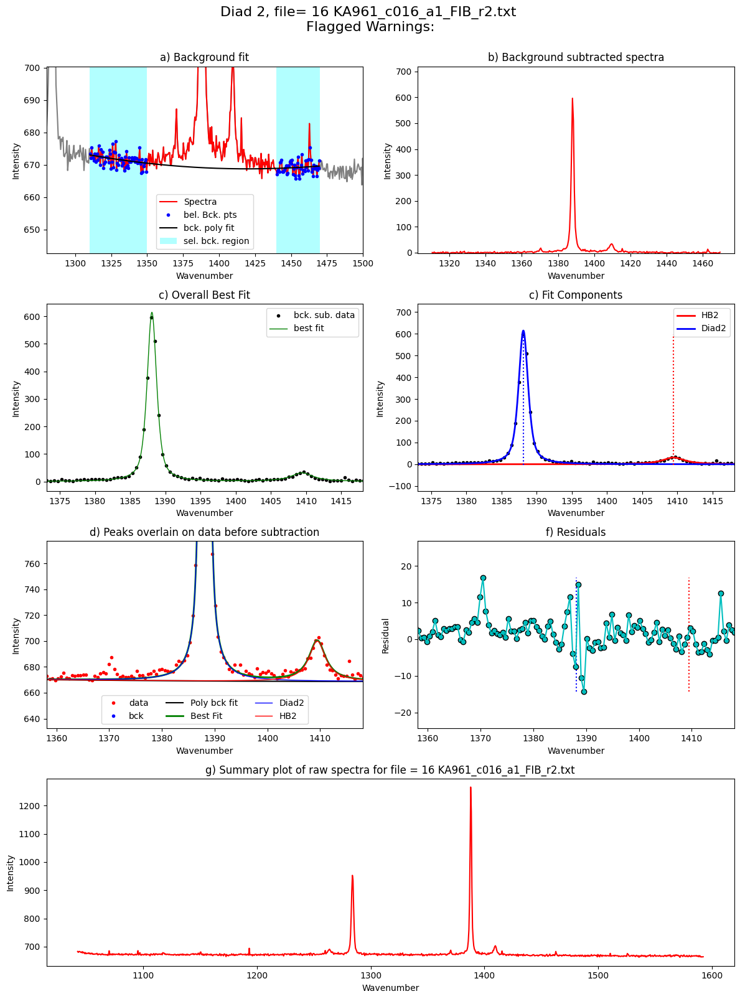

In [47]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/24 [00:00<?, ?it/s]

Processing file: 09 KA961_c011_a1_FIA_CRR_DiadFit.txt


  4%|▍         | 1/24 [00:02<01:08,  2.98s/it]

Processing file: 13 KA961_c015_a1_FIA.txt


  8%|▊         | 2/24 [00:06<01:08,  3.12s/it]

Processing file: 14 KA961_c016_a1_FIA_r1_CRR_DiadFit.txt


 12%|█▎        | 3/24 [00:10<01:15,  3.60s/it]

Processing file: 15 KA961_c016_a1_FIB_r1.txt


 17%|█▋        | 4/24 [00:13<01:09,  3.46s/it]

Processing file: 16 KA961_c016_a1_FIB_r2.txt


 21%|██        | 5/24 [00:17<01:05,  3.43s/it]

Processing file: 17 KA961_c016_a1_FIA_r2_CRR_DiadFit.txt


 25%|██▌       | 6/24 [00:20<01:01,  3.39s/it]

Processing file: 18 KA961_c016_a2_FIC.txt


 29%|██▉       | 7/24 [00:23<00:57,  3.41s/it]

Processing file: 19 KA961_c017_a1_FIA.txt


 33%|███▎      | 8/24 [00:27<00:54,  3.41s/it]

Processing file: 20 KA961_c017_a1_FIB.txt
refit attempt 1


 38%|███▊      | 9/24 [00:30<00:51,  3.45s/it]

Processing file: 21 KA961_c017_a1_FIC_CRR_DiadFit.txt


 42%|████▏     | 10/24 [00:35<00:55,  3.95s/it]c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3218: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 24 KA961_c019_a1_FIA.txt


 46%|████▌     | 11/24 [00:39<00:49,  3.83s/it]

Processing file: 25 KA961_c020_a1_FIA.txt


 50%|█████     | 12/24 [00:42<00:44,  3.69s/it]

Processing file: 26 KA961_c021_a1_FIA.txt


 54%|█████▍    | 13/24 [00:45<00:38,  3.51s/it]

Processing file: 27 KA961_c022_a1_FIA.txt


 58%|█████▊    | 14/24 [00:48<00:32,  3.28s/it]

Processing file: 28 KA961_c023_a1_FIA.txt


 62%|██████▎   | 15/24 [00:51<00:27,  3.07s/it]

Processing file: 30 KA961_c023_a2_FIB.txt


 67%|██████▋   | 16/24 [00:53<00:22,  2.85s/it]

Processing file: 31 KA961_c024_a1_FIA.txt


 71%|███████   | 17/24 [00:55<00:18,  2.67s/it]

Processing file: 33 KA961_c025_a1_FIA.txt


 75%|███████▌  | 18/24 [00:58<00:16,  2.81s/it]

Processing file: 35 KA961_c026_a1_FIA_CRR_DiadFit.txt


 79%|███████▉  | 19/24 [01:03<00:17,  3.47s/it]

Processing file: 36 KA961_c027_a1_FIA.txt
refit attempt 1


 83%|████████▎ | 20/24 [01:07<00:13,  3.48s/it]

Processing file: 37 KA961_c027_a1_FIB.txt


 88%|████████▊ | 21/24 [01:09<00:09,  3.22s/it]

Processing file: 38 KA961_c027_a1_FIC_CRR_DiadFit.txt


 92%|█████████▏| 22/24 [01:12<00:06,  3.01s/it]

Processing file: 41 KA961_c029_a1_FIA.txt


 96%|█████████▌| 23/24 [01:15<00:02,  2.89s/it]

Processing file: 43 KA961_c029_a1_FIC_CRR_DiadFit.txt


100%|██████████| 24/24 [01:17<00:00,  3.25s/it]


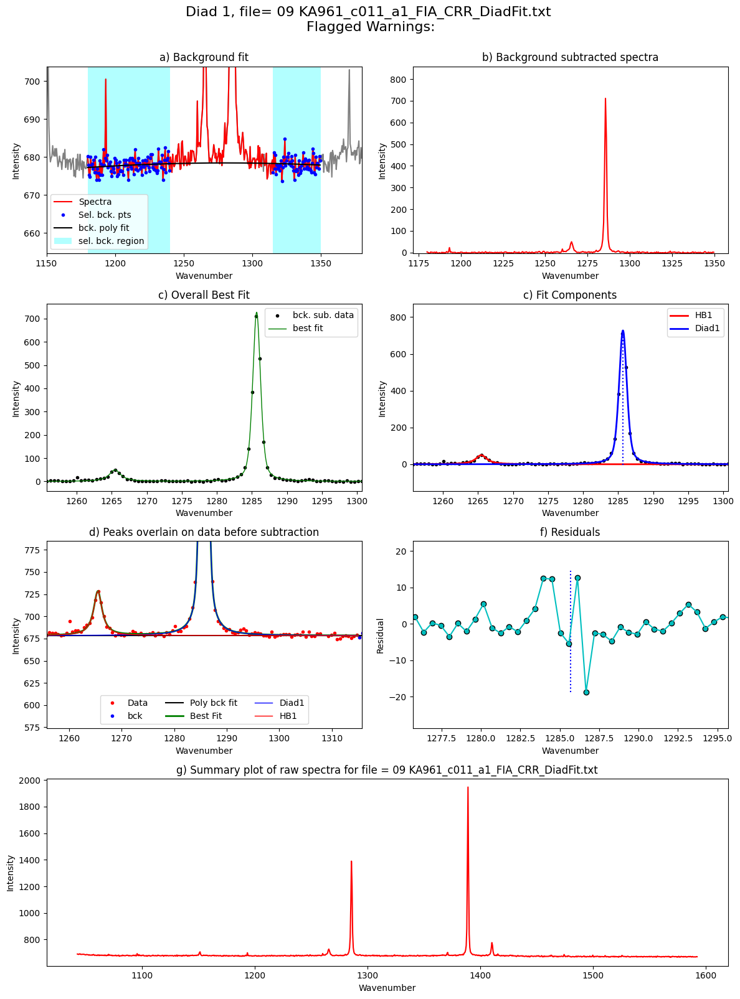

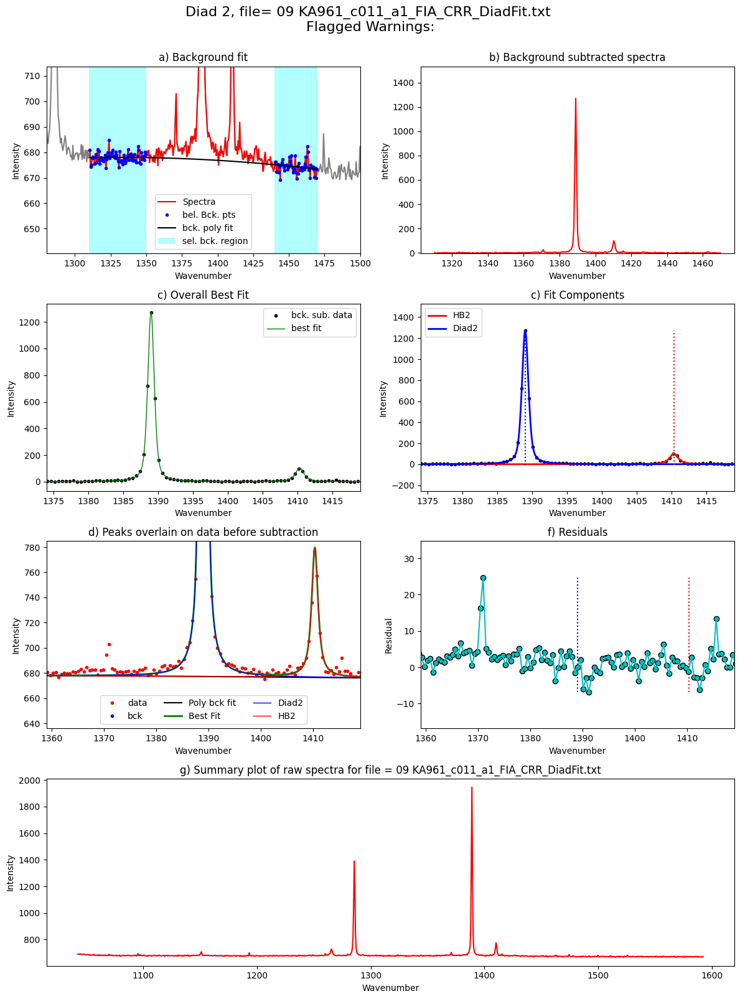

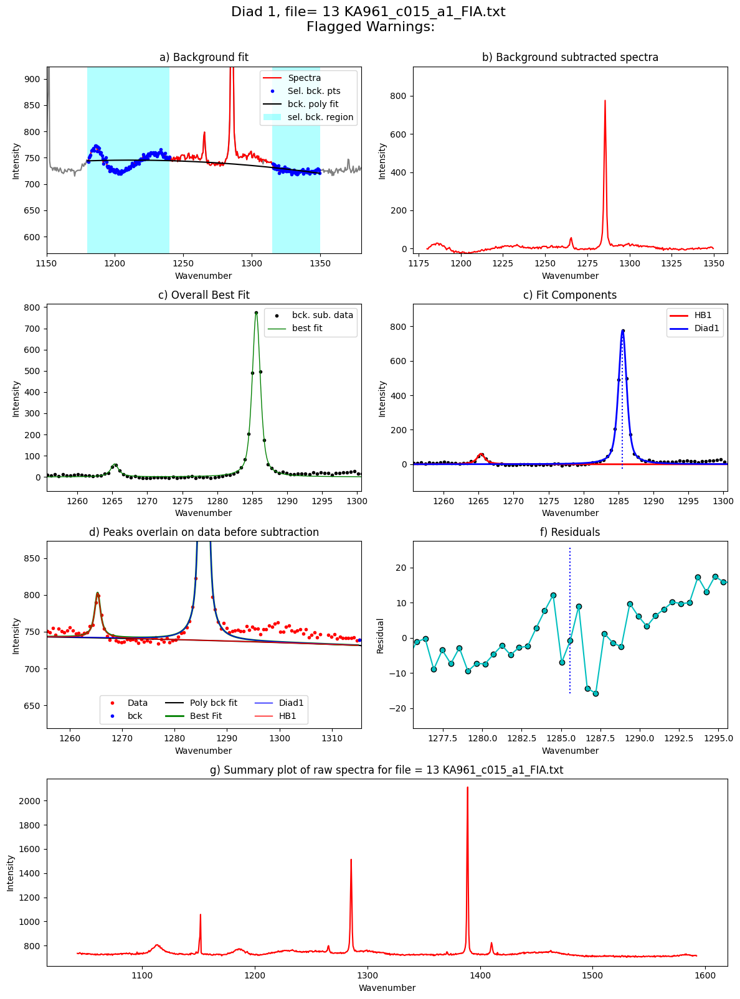

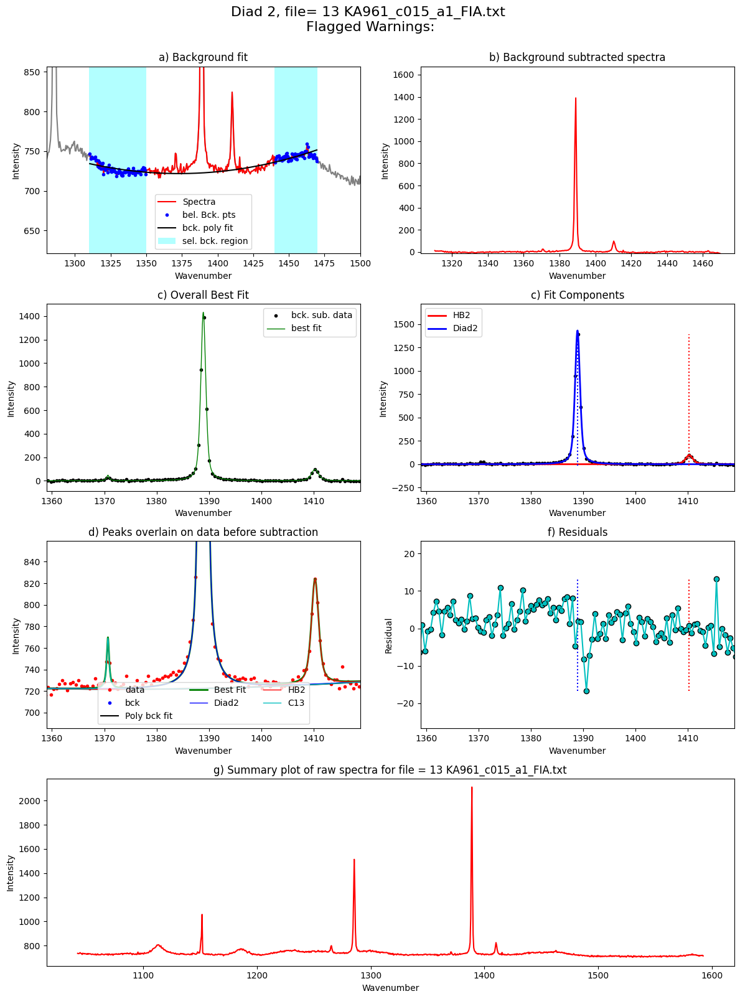

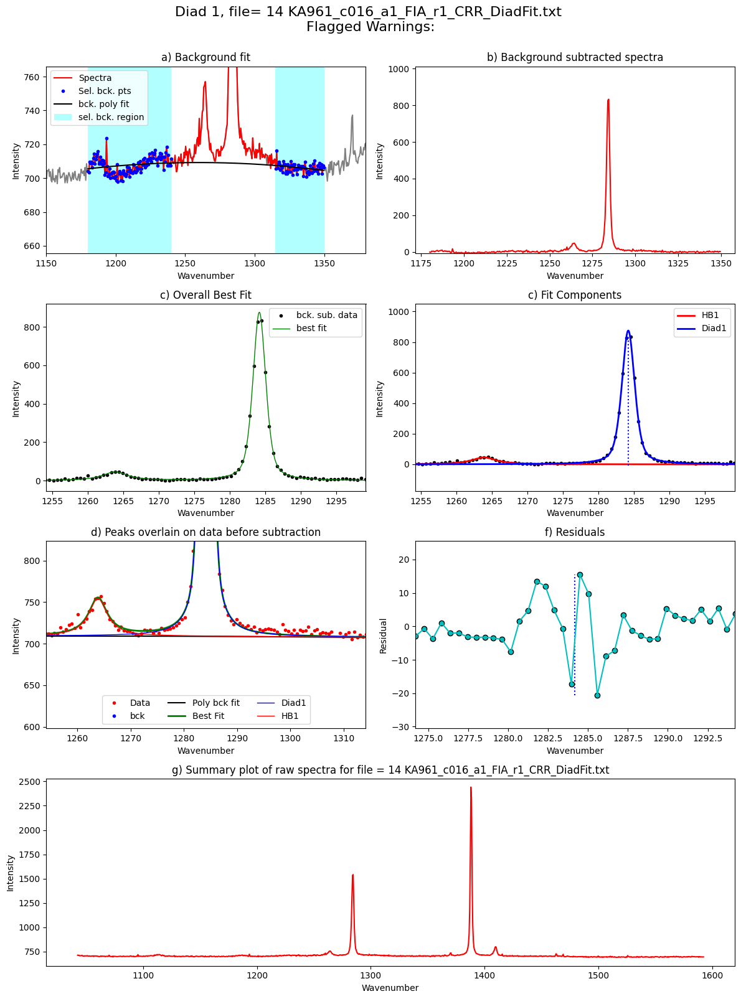

...

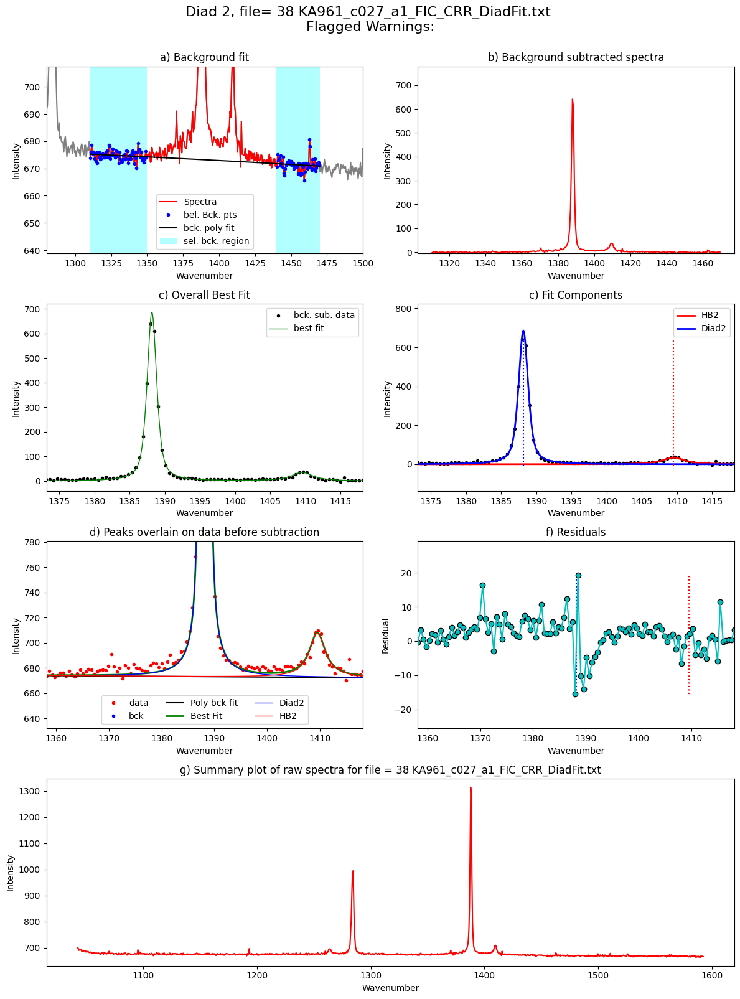

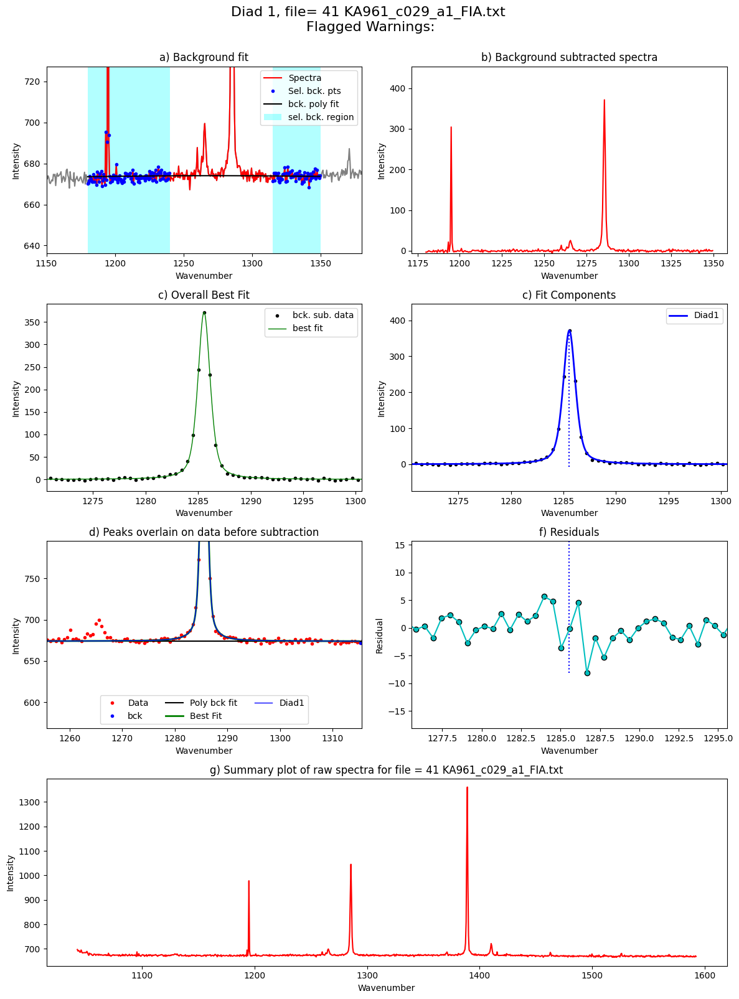

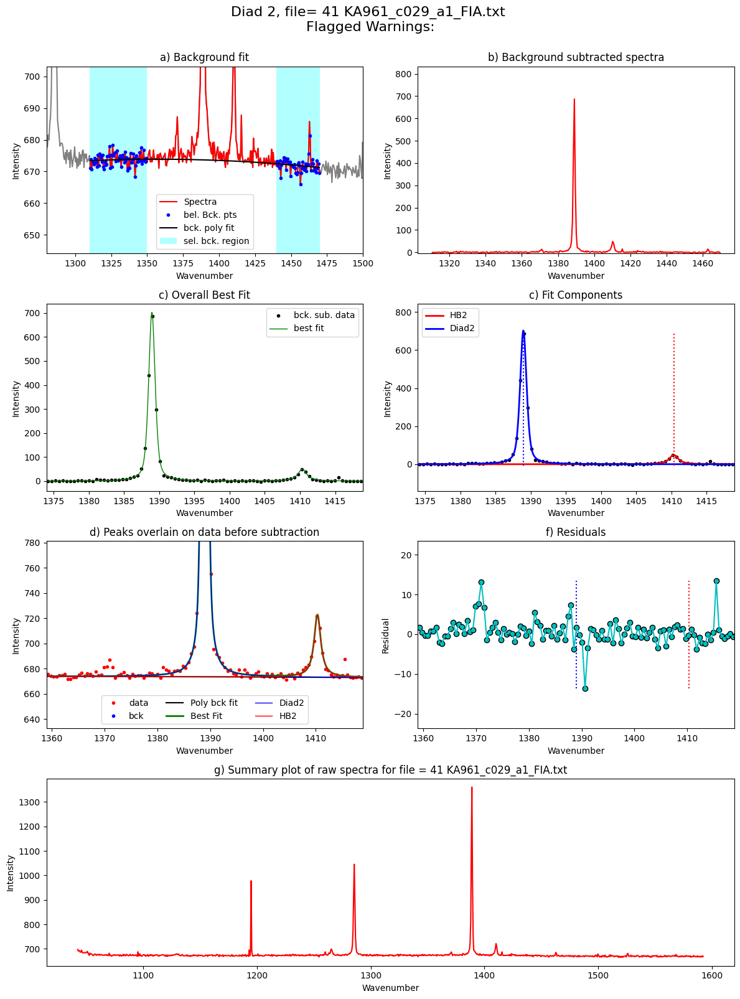

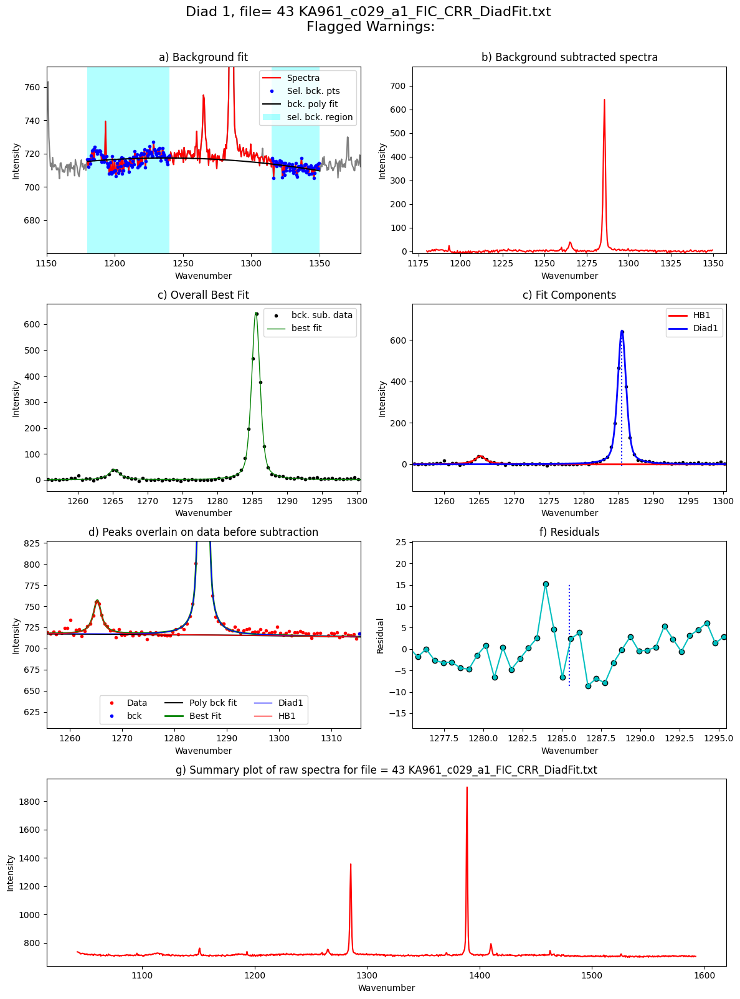

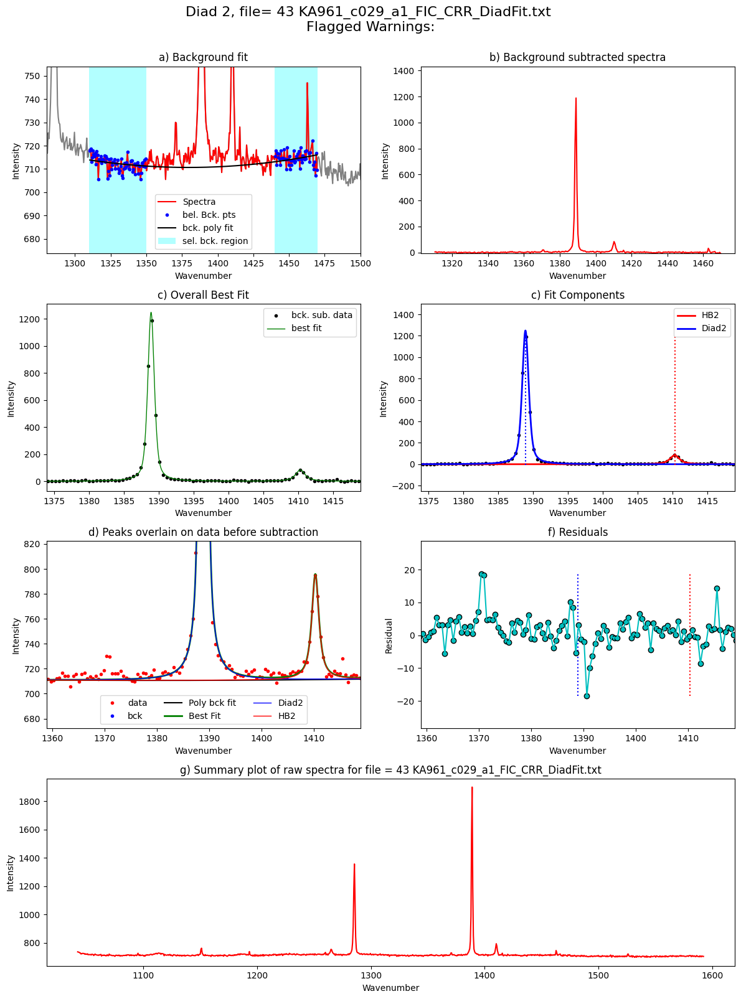

In [48]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [49]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)
if batch=='Std':
    combo.to_excel('Std_Diads.xlsx', index=False)

In [50]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,KA961_c011_a1_FIA_CRR_DiadFit,103.330436,0.003076,1285.679335,0.002673,727.728518,1285.679385,1256.313544,0.664068,2.193266,...,1.056701,1.020408,0.075307,0.001825,1.065625,1.067265,0.072900,0.000872,PseudoVoigtModel,PseudoVoigtModel
1,KA961_c015_a1_FIA,103.352247,0.009808,1285.582580,0.009600,776.025253,1285.582630,1455.443851,0.691700,8.154362,...,1.024450,1.072954,0.033824,0.001783,1.179811,1.167816,0.203854,0.000791,PseudoVoigtModel,PseudoVoigtModel
2,KA961_c016_a1_FIA_r1_CRR_DiadFit,103.968286,0.004823,1284.194395,0.004293,875.824240,1284.194445,2495.299629,1.080494,3.868757,...,1.145000,1.150668,0.313343,0.002467,1.060738,1.104430,0.096424,0.000860,PseudoVoigtModel,PseudoVoigtModel
3,KA961_c016_a1_FIB_r1,104.010970,0.008178,1284.098328,0.007761,465.949170,1284.098328,1322.519268,1.058866,3.620604,...,1.145548,1.092637,0.308232,0.004545,1.012739,1.087363,0.020222,0.001656,PseudoVoigtModel,PseudoVoigtModel
4,KA961_c016_a1_FIB_r2,104.022263,0.009910,1284.077068,0.009192,288.115557,1284.077068,838.912088,1.128044,2.435594,...,1.159164,1.109589,0.359088,0.007830,1.027368,1.107477,0.044095,0.002620,PseudoVoigtModel,PseudoVoigtModel
5,KA961_c016_a1_FIA_r2_CRR_DiadFit,103.971144,0.005175,1284.204373,0.004440,572.792904,1284.204423,1633.902324,1.062886,2.698029,...,1.108878,1.153753,0.231449,0.003711,1.040598,1.068966,0.064337,0.001325,PseudoVoigtModel,PseudoVoigtModel
6,KA961_c016_a2_FIC,104.119536,0.003204,1283.882972,0.002569,1299.827011,1283.883022,3936.790993,1.137957,3.924999,...,1.014837,1.035870,0.033767,0.001751,1.026971,1.065350,0.044049,0.000576,PseudoVoigtModel,PseudoVoigtModel
7,KA961_c017_a1_FIA,103.602258,0.013643,1285.002863,0.012794,267.651592,1285.002863,722.696266,1.026289,3.668385,...,1.275142,1.347222,0.564751,0.007669,1.020833,1.103918,0.030445,0.002592,PseudoVoigtModel,PseudoVoigtModel
8,KA961_c017_a1_FIB,103.871023,0.005295,1284.441439,0.004397,864.322113,1284.441489,2554.476192,1.115903,3.714109,...,1.180464,1.219277,0.402760,0.002582,1.219858,1.225424,0.341658,0.000814,PseudoVoigtModel,PseudoVoigtModel
9,KA961_c017_a1_FIC_CRR_DiadFit,103.695954,0.009420,1284.822652,0.008908,320.204192,1284.822652,831.024747,0.956706,3.051843,...,1.162524,1.233103,0.310975,0.005976,1.005000,1.070547,0.006808,0.002046,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [51]:
import os

if os.name=="posix":

    def mac_notification(title, subtitle, message):
        """
        Display a macOS notification with the default sound using AppleScript.
        
        Args:
        - title: Title of the notification.
        - subtitle: Subtitle of the notification.
        - message: Main message content of the notification.
        """
        os.system("""
                osascript -e 'display notification "{}" with title "{}" subtitle "{}" sound name "default"'
                """.format(message, title, subtitle))

    mac_notification("Notebook Completed", "VSCode", "Step3 Fit All")

else:

    # %pip install winotify

    from winotify import Notification, audio

    toast= Notification(app_id="VSCode",title="Notebook completed",
                        msg="Step3 Fitall is done!",
                        duration="short")
    toast.set_audio(audio.Mail,loop=False)
    toast.show()